# Exploring Features of Musical Tracks with Python

## Step 0. Setup

In [34]:
##In collaboration with Souvik's code and GitHub
##Link to Souvik's production: https://github.com/Souvik-Mandal-Harvard/LS100_2025_Harvard/
#blob/fc4550a42d28278e202189acbd411ec34f776508/LS100_2025Fall_FeatureExtractionfromDigitalAudio_Python.ipynb
# %pip install -q librosa soundfile matplotlib seaborn

from pathlib import Path
import numpy as np
import pandas as pd
import librosa, librosa.display
import re
import matplotlib.pyplot as plt
import seaborn as sns

# %pip install plotly
import plotly.graph_objects as go
import plotly.express as px

sns.set_theme(style="whitegrid", context="notebook", palette="muted")

plt.rcParams.update({
    "figure.figsize": (10, 3),      
    "axes.titlesize": 13,
    "axes.labelsize": 11,
    "axes.grid": True,
    "grid.alpha": 0.3,
    "grid.linestyle": "--",
    "axes.facecolor": "#f9f9f9",
    "figure.facecolor": "white",
})

#sns.set_theme(style="darkgrid", context="notebook", palette="muted")

#to make graphs interactive, install this package
import plotly.io as pio
pio.renderers.default = 'notebook'  # or 'jupyterlab'

In [27]:
import plotly.io as pio
pio.renderers.default = 'notebook'  # or 'jupyterlab'

In [39]:
!pip install plotly


## Step 1.0. Load one audio file and visualize the waveform

We’ll start by loading a single track; paste the location of the track below.

In [17]:
audio_path = Path("/Users/anouska/Desktop/LS100R/zap_Ra_Bacheeza.mp3")

### Now, let's plot its waveform.  
The waveform shows how amplitude (loudness) changes over time.


<details>
<summary><b>What are we loading - the <code>y</code> and <code>sr</code>?</b> (click to expand)</summary>

When we load an audio file with **librosa**, we usually write:

```python
y, sr = librosa.load(audio_path, sr=None) # librosa loads the track as mono by default. You can add `mono=True/ False` after sr=None.
````

Here’s what each variable means:

| Variable | Meaning                       | In simple words                                                                                                                                     | Example                          |
| -------- | ----------------------------- | --------------------------------------------------------------------------------------------------------------------------------------------------- | -------------------------------- |
| **`y`**  | The **audio time series**     | A long list (NumPy array) of numbers representing the **waveform** — how air pressure changes over time. Each value is a tiny snapshot of loudness. | `[-0.0021, 0.0053, 0.0089, ...]` |
| **`sr`** | The **sampling rate** (in Hz) | How many of those numbers are recorded **per second**. Typical values are **44,100 Hz** (CD quality) or **48,000 Hz** (studio standard).            | `44100`                          |

🧩 Additional notes:

* If you load **mono**, `y` has shape `(n_samples,)`.
* If you load **stereo**, `y` has shape `(2, n_samples)` — one row per channel (Left, Right).
* You can compute duration easily:

  ```python
  duration_sec = len(y) / sr
  print(f"Duration: {duration_sec:.2f} seconds")
  ```
</details>


Loaded: zap_Ra_Bacheeza.mp3
Sample rate: 44100 Hz  |  Samples: 8272512   |  Duration: 187.59 s


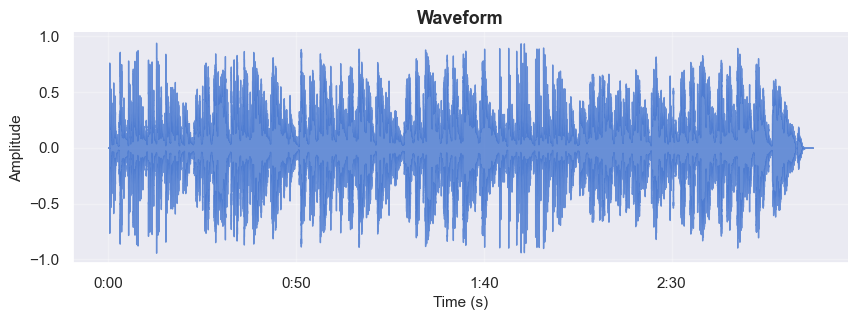

In [18]:

if audio_path.exists():
    y, sr = librosa.load(audio_path, sr=None) 
    duration_sec = len(y) / sr
    print(f"Loaded: {audio_path.name}")
    print("Sample rate:", sr, "Hz  |  Samples:", len(y), "  |  Duration:", round(duration_sec, 2), "s")
else:
    print("❗ Please set audio_path to a valid .wav or .mp3 file.")
    y, sr = None, None

if y is not None:
    sns.set_style("darkgrid")
    plt.figure()
    librosa.display.waveshow(y, sr=sr, color=sns.color_palette("muted")[0], alpha=0.8)
    plt.title("Waveform", fontsize=13, fontweight="bold")
    plt.xlabel("Time (s)")
    plt.ylabel("Amplitude")
    sns.despine()
    plt.show()


### If you want an interactive plot for the waveform, run the following code bock.

In [28]:
#Interactive waveform (Plotly)
#Used packages/ modules: numpy as np; plotly.graph_objects as go

if y is not None:
    # Time axis
    t = np.arange(len(y)) / sr

    # Lightweight downsampling for interactivity (aim ~5k points)
    target_pts = 5000
    step = max(1, len(y) // target_pts)
    t_ds = t[::step]
    y_ds = y[::step]

    fig = go.Figure()

    fig.add_trace(
        go.Scatter(
            x=t_ds,
            y=y_ds,
            mode="lines",
            line=dict(width=1.2),
            name="Waveform",
            hovertemplate="t = %{x:.2f}s<br>amp = %{y:.3f}<extra></extra>",
        )
    )

    fig.update_layout(
        title=dict(text="Waveform (Interactive)", x=0.5),
        xaxis=dict(
            title="Time (s)",
            rangeselector=dict(
                buttons=list([
                    dict(count=5, label="5s", step="second", stepmode="backward"),
                    dict(count=30, label="30s", step="second", stepmode="backward"),
                    dict(step="all")
                ])
            ),
            rangeslider=dict(visible=True),
            type="linear",
            showgrid=True,
            zeroline=False,
        ),
        yaxis=dict(
            title="Amplitude",
            showgrid=True,
            zeroline=False,
        ),
        height=300,
        margin=dict(l=60, r=30, t=60, b=50),
        hovermode="x unified",
        showlegend=False,
    )
    
    fig.show()
    
else:
    print("Please load an audio file first (see Step 1).")


## Step 2 — From Waveform to Frequency: The Discrete Fourier Transform (DFT)

Now that we’ve seen what the audio looks like as a waveform — amplitude changing over time — let’s explore **what frequencies** make up that sound.  
We can take the full track or a short slice of the waveform and compute its **Discrete Fourier Transform (DFT)** to reveal its frequency components.

> The DFT answers the question: “*What notes or tones are present in this track (or at a particular moment of it)?*”

---

### 2.1 The Full-Track DFT

If we take the DFT of the entire song, we get the **overall frequency content** — a kind of “fingerprint” of all tones and harmonics that ever occur.  
For example, it might show that there’s a strong 440 Hz tone (A4) somewhere in the track.  

However:
- It tells us **what** frequencies are present,  
- but **not *when*** they occur.  
Everything is merged together into a single global spectrum.

---

### Understanding the Y-Axis (in Decibels)

The vertical axis shows **magnitude** — the strength of each frequency component — but it’s measured in **decibels (dB)** instead of raw amplitude.

That’s why you see **negative values** on the y-axis.

| Concept | Explanation |
|:--|:--|
| **Reference (0 dB)** | The loudest frequency in the entire track. It’s the peak amplitude. |
| **Negative values (e.g., –20 dB, –60 dB)** | Frequencies that are quieter than the loudest one. For instance, –20 dB means 10× quieter; –60 dB means 1000× quieter. |
| **Why use dB?** | The decibel scale matches how human hearing perceives loudness — logarithmically — and it compresses a huge dynamic range into a readable plot. |

.
> In simple terms:  
> **0 dB = loudest tone**,  
> **–80 dB = much quieter tone**,  
> but all values are still positive in energy — “negative dB” just means “quieter than the loudest frequency.”

---

Next, we’ll visualize this DFT interactively and overlay **typical instrument frequency bands** (bass, vocals, cymbals, etc.) to understand where each part of the mix lives in the spectrum.


In [17]:
!python --version

Python 3.12.8


In [29]:
# Step 2.1: Global DFT with instrument bands (Plotly; no overlaps, legend outside right)
import numpy as np
import plotly.graph_objects as go
import plotly.express as px

if y is None:
    print("Please load an audio file in Step 1 first.")
else:
    # Compute full-track DFT
    N = len(y)
    Y = np.fft.rfft(y)
    freqs = np.fft.rfftfreq(N, d=1/sr)
    mag = np.abs(Y)
    mag_db = 20 * np.log10(np.maximum(mag, 1e-12) / np.max(mag))

    # Focus range
    fmin, fmax = 20.0, 20000.0
    use = (freqs >= fmin) & (freqs <= fmax)
    freqs_use = freqs[use]
    mag_db_use = mag_db[use]

    # Downsample for interactivity (log-spaced)
    n_bins = 2000
    bins = np.geomspace(fmin, fmax, n_bins + 1)
    which_bin = np.digitize(freqs_use, bins) - 1
    pooled_f, pooled_db = [], []
    for b in range(n_bins):
        mask = which_bin == b
        if np.any(mask):
            f_left, f_right = bins[b], bins[b + 1]
            pooled_f.append(np.sqrt(f_left * f_right))
            pooled_db.append(np.max(mag_db_use[mask]))
    pooled_f = np.asarray(pooled_f, float)
    pooled_db = np.asarray(pooled_db, float)

    peak_db = float(np.nanmax(pooled_db))
    y_min, y_max = peak_db - 80.0, peak_db + 3.0

    # Band definitions
    bands = [
        {"label": "Bass & Kick Drum",       "range": (20,   250),  "color": "#fde725", "alpha": 0.20},
        {"label": "Vocals, Guitars, Snare", "range": (250,  5000), "color": "#55c667", "alpha": 0.15},
        {"label": "Cymbals & Air",          "range": (5000, 20000),"color": "#3b528b", "alpha": 0.12},
    ]

    fig = go.Figure()

    # Spectrum line
    fig.add_trace(
        go.Scatter(
            x=pooled_f, y=pooled_db, mode="lines",
            line=dict(width=1.3, color=px.colors.qualitative.Plotly[0]),
            name="Magnitude (dB, ref max)",
            hovertemplate="f = %{x:.1f} Hz<br>dB = %{y:.1f}<extra></extra>",
        )
    )

    # Add shaded bands as shapes (no legend, never overlap labels)
    for b in bands:
        fig.add_vrect(
            x0=b["range"][0], x1=b["range"][1],
            fillcolor=b["color"], opacity=b["alpha"],
            line_width=0, layer="below"
        )

    # Add dummy legend items for the bands (no data plotted)
    for b in bands:
        fig.add_trace(
            go.Scatter(
                x=[None], y=[None],
                mode="markers",
                marker=dict(size=10, color=b["color"]),
                name=b["label"],
                hoverinfo="skip",
                showlegend=True,
            )
        )

    # Layout: legend outside on the right, extra right margin, no overlaps
    fig.update_layout(
        title=dict(text="Global Magnitude Spectrum with Instrument Frequency Bands", x=0.5),
        xaxis=dict(
            title="Frequency (Hz)",
            type="log",
            range=[np.log10(fmin), np.log10(fmax)],
            showgrid=True, zeroline=False
        ),
        yaxis=dict(
            title="Magnitude (dB, ref max)",
            range=[y_min, y_max],
            showgrid=True, zeroline=False
        ),
        height=360,
        margin=dict(l=60, r=200, t=70, b=60),   # <- make room for right-side legend
        legend=dict(
            orientation="v",
            xanchor="left", x=1.02,              # <- outside right
            yanchor="top",  y=1.0,
            bgcolor="rgba(255,255,255,0.85)",
            bordercolor="rgba(0,0,0,0.15)",
            borderwidth=1,
            font=dict(size=11)
        ),
        hovermode="x unified"
    )

    # Prevent label clipping
    fig.update_xaxes(automargin=True)
    fig.update_yaxes(automargin=True)
    fig.add_annotation(x=100,  y=-10, text="Bass & Kick Drum", showarrow=False, font=dict(size=11))
    fig.add_annotation(x=1000, y=-10, text="Vocals, Guitars, Snare", showarrow=False, font=dict(size=11))
    fig.add_annotation(x=10000, y=-10, text="Cymbals & Air", showarrow=False, font=dict(size=11))


    print(f"Track length: {N:,} samples  |  Duration: {N/sr:.2f} s")
    print(f"Frequency resolution: {sr/N:.4f} Hz per bin")

    fig.show()


Track length: 8,272,512 samples  |  Duration: 187.59 s
Frequency resolution: 0.0053 Hz per bin


### 2.2. The short-slice (windowed) DFT
- Music constantly changes — new notes, instruments, and beats appear over time.  
- To capture this evolution, we take a **short slice** of the waveform (for example, 1 second).  
- The DFT of this slice shows the **frequencies active at that specific moment**.  
- Repeating this for overlapping slices across time produces a **spectrogram** —  a visual record of *how the frequency content changes through the song*.

### The time–frequency trade-off
| Window Length | Frequency Resolution | Time Resolution | When to Use |
|----------------|----------------------|-----------------|--------------|
| **Long window** | Precise frequency details | Blurry timing | For stable, steady notes |
| **Short window** | Less precise frequencies | Better timing accuracy | For fast-changing sounds or rhythms |

.
> Tip: Start with ~1 second, then try shorter/longer and watch the peaks sharpen or blur.

In [21]:
# DEFINE AT WHAT POINT OF TIME YOU WANT TO ANALYZE THE SPECTRUM
center_t = 30.0   # seconds
slice_sec = 1.0   # seconds (try 0.5, 2.0, ...)

In [30]:
# Step 2.2: One-slice DFT (interactive, Plotly)
# Used packages/modules: numpy as np; plotly.graph_objects as go

if y is None:
    print("Please load an audio file in Step 1 first.")
else:
    # pick the slice (kept inside file bounds)
    duration_sec = len(y) / sr
    center_t = float(np.clip(center_t, slice_sec/2, max(slice_sec/2, duration_sec - slice_sec/2)))
    i0 = int(round((center_t - slice_sec/2) * sr))
    i1 = i0 + int(round(slice_sec * sr))
    x = y[i0:i1]

    if len(x) < 4:
        print("Audio slice too short to analyze.")
    else:
        # window + zero-pad to next power of 2, then FFT
        w = np.hanning(len(x))
        xw = x * w
        N = int(2 ** np.ceil(np.log2(len(xw))))  # next power of 2
        X = np.fft.rfft(xw, n=N)
        f = np.fft.rfftfreq(N, d=1.0/sr)

        mag = np.abs(X)
        mag_db = 20.0 * np.log10(np.maximum(mag, 1e-12) / (np.max(mag) + 1e-12))
        delta_f = sr / N
        print(f"Slice center: {center_t:.2f}s | Window: {len(x)} samples | N_fft: {N} | Δf ≈ {delta_f:.2f} Hz")

        # pick top K well-separated peaks for markers
        K = 5
        low_hz = 100.0
        idx_ok = np.where(f >= low_hz)[0]
        if idx_ok.size:
            # take many candidates then enforce spacing
            cand = idx_ok[np.argsort(mag[idx_ok])[-(K*6):]]         # more than K
            cand = cand[np.argsort(mag[cand])[::-1]]                # sort by strength
            marked = []
            for k in cand:
                if all(abs(f[k] - f[j]) > 30 for j in marked):      # ≥30 Hz apart
                    marked.append(k)
                if len(marked) >= K:
                    break
        else:
            marked = []

        # dynamic y-range (~80 dB window)
        peak_db = float(np.nanmax(mag_db))
        y_min, y_max = peak_db - 80.0, peak_db + 3.0

        # build Plotly figure
        fig = go.Figure()

        # main spectrum line
        fig.add_trace(go.Scatter(
            x=f, y=mag_db, mode="lines",
            line=dict(width=1.3),
            name="Magnitude (dB, ref max)",
            hovertemplate="f = %{x:.1f} Hz<br>dB = %{y:.1f}<extra></extra>",
        ))

        # vertical markers for peaks
        for k in marked:
            fig.add_vline(
                x=float(f[k]), line_width=1, line_dash="dash", line_color="gray",
                annotation_text=f"{int(f[k])} Hz", annotation_position="top right",
                annotation_font=dict(size=10, color="gray")
            )

        # layout: log x-axis, slider, compact margins
        fig.update_layout(
            title=dict(text="One-Slice Magnitude Spectrum (DFT, dB)", x=0.5),
            xaxis=dict(
                title="Frequency (Hz)",
                type="log",
                range=[np.log10(max(20, f[1] if len(f) > 1 else 20)), np.log10(sr/2)],
                rangeslider=dict(visible=False),
                showgrid=True, zeroline=False
            ),
            yaxis=dict(
                title="Magnitude (dB, ref max in slice)",
                range=[y_min, y_max],
                showgrid=True, zeroline=False
            ),
            height=300,
            margin=dict(l=60, r=30, t=60, b=50),
            hovermode="x unified",
            showlegend=False
        )

        fig.show()


Slice center: 30.00s | Window: 44100 samples | N_fft: 65536 | Δf ≈ 0.67 Hz


## 2.3. Spectrogram: Frequencies Changing Over Time

A **spectrogram** shows how sound energy is distributed across **frequency** as the music progresses in **time**.

| Axis | Represents | Description |
|------|-------------|--------------|
| **X-axis** | Time | Moves left → right as the song plays |
| **Y-axis** | Frequency | Low notes at the bottom, high notes at the top |
| **Color (intensity)** | Amplitude (loudness) | Brighter areas mean stronger energy at that frequency |

.
> Think of it as: **DFT on many short, overlapping slices** → stack the spectra → color by strength.

**Explore before coding:**  
Try this interactive website to *see* how different sounds look in a spectrogram:  
👉 [musiclab.chromeexperiments.com/spectrogram](https://musiclab.chromeexperiments.com/spectrogram)

💡 A spectrogram is like a *thermal camera for sound*:  
- **Horizontal bands** often correspond to sustained harmonics — vocals, guitar, or synths.  
- **Vertical bursts** usually represent transients — drum hits or sharp attacks.
----


<details>
<summary><b>How we compute the spectrogram (and why use the Mel scale + dB)</b> (click to expand)</summary>

To build a spectrogram, we:

1. Slice the audio into overlapping windows.
2. Compute a **Short-Time Fourier Transform (STFT)** for each window to find the active frequencies.
3. Stack all slices together in time order — this becomes the spectrogram.

There are two common types:
- **STFT spectrogram** → frequencies in *Hz* (raw physical values).  
- **Mel-spectrogram** → frequencies warped to match *human hearing* (dense in lows, sparse in highs).

We’ll use a **Mel-spectrogram** because:
- It mirrors how the ear perceives pitch.
- It focuses resolution where it matters most for music — bass, vocals, and midrange.
- It converts energy to **decibels (dB)** using `power_to_db`, making quiet details visible.

| Parameter | Effect | When to Adjust |
|------------|--------|----------------|
| `n_fft` | Larger = better frequency resolution, blurrier time | Long sustained tones |
| `hop_length` | Smaller = finer time resolution, more frames | Percussive or fast passages |
| `n_mels` | More Mel bands = smoother detail | Rich harmonic music |

We’ll keep `hop_length` consistent with earlier steps so that time axes align across plots.
</details>


In [31]:
# Step 2.3: Mel-Spectrogram (interactive, Plotly)
# Uses: numpy as np; librosa; plotly.graph_objects as go

if y is None:
    print("Please load an audio file in Step 1 first.")
else:
    # Parameters (feel free to experiment)
    n_fft = 2048
    hop_length = 512          # keep consistent with earlier steps
    n_mels = 128
    fmin, fmax = 20.0, sr/2   # Mel range

    # Mel-spectrogram (power) -> dB
    S = librosa.feature.melspectrogram(
        y=y, sr=sr, n_fft=n_fft, hop_length=hop_length,
        n_mels=n_mels, fmin=fmin, fmax=fmax, power=2.0
    )
    S_db = librosa.power_to_db(S, ref=np.max)

    # Axes
    times = librosa.frames_to_time(np.arange(S_db.shape[1]), sr=sr, hop_length=hop_length)
    mel_freqs_hz = librosa.mel_frequencies(n_mels=n_mels, fmin=fmin, fmax=fmax)

    # Dynamic Z range (~80 dB window for contrast)
    zmax = float(np.nanmax(S_db))
    zmin = zmax - 80.0

    # Build interactive heatmap
    fig = go.Figure(
        data=go.Heatmap(
            x=times,
            y=mel_freqs_hz,        # show y in Hz even though spacing is Mel
            z=S_db,
            colorscale="Magma",
            zmin=zmin, zmax=zmax,
            colorbar=dict(title="dB")
        )
    )

    # Nice ticks for log-frequency
    tick_vals = [50, 100, 200, 500, 1000, 2000, 5000, 10000, min(20000, int(sr/2))]
    tick_vals = [v for v in tick_vals if fmin <= v <= fmax]

    fig.update_layout(
        title=dict(text="Mel-Spectrogram (dB)", x=0.5),
        xaxis=dict(
            title="Time (s)",
            rangeslider=dict(visible=True),   # zoom with slider
            showgrid=True, zeroline=False
        ),
        yaxis=dict(
            title="Frequency (Hz, Mel-spaced)",
            type="log",                       # log display for intuitive reading
            tickmode="array",
            tickvals=tick_vals,
            ticktext=[f"{v//1000}k" if v>=1000 else f"{v}" for v in tick_vals],
            showgrid=True, zeroline=False
        ),
        height=320,
        margin=dict(l=70, r=40, t=60, b=60),
    )

    # Hover shows time, freq, and dB
    fig.update_traces(
        hovertemplate="t = %{x:.2f}s<br>f = %{y:.0f} Hz<br>level = %{z:.1f} dB<extra></extra>"
    )

    fig.show()


# Step 3. Extract Tempo, Beats, and Rhythm Structure

Now that we can visualize how sound changes across frequencies, let’s focus on the **time structure** of the music —  
its *tempo* (speed), *beat pattern*, and *rhythmic flow*.

These rhythmic features form the **backbone** of most musical tracks:
- **Tempo (BPM)** → how fast the music is.  
- **Beats** → the recurring pulses you could tap your foot to.  
- **Downbeats and rhythm structure** → how beats group into measures (the musical "grid").

## 3.1 : Tempo, Beats

In this step, we’ll use `librosa` to detect:
1. The **global tempo** of the track (in Beats Per Minute, or BPM),
2. The **positions of beats** over time,
3. The **local tempo curve** — how the rhythm evolves or fluctuates across the song.

----


<details>
<summary><b>How does a computer detect rhythm — and can a song have multiple tempos?</b> (click to expand)</summary>

Humans sense rhythm intuitively — we tap our foot or nod along.  
Computers must **analyze the waveform** to find repeating energy patterns, then estimate the timing of those pulses.

Here’s the step-by-step idea:

1. **Onset Detection:**  
   The program measures sudden changes in loudness or energy.  
   Each spike (called an *onset*) marks the beginning of a sound event — like a drum hit or chord.

2. **Beat and Tempo Estimation:**  
   By looking at how often onsets occur, we can estimate the **tempo** (beats per minute, or BPM).  
   Most songs have one clear tempo, but some can contain **multiple dominant tempos** —  
   for example, a halftime or double-time section, or a brief tempo shift during a solo.

3. **Dominant BPMs:**  
   By aggregating tempo energy across time, we can identify one or more **dominant tempos** that the song tends to revolve around.  
   Each dominant BPM shows a stable rhythmic “mode” of the track.

4. **Rhythm Structure:**  
   Once beats are identified, we can map how tempo evolves — this reveals **performance dynamics**,  
   such as small accelerations, slowdowns, or expressive rubato.

> **Key takeaway:**  
> A steady pop song will typically have **one strong dominant BPM**,  
> while more complex or live performances can show **two or more rhythmic modes**.
</details>


In [32]:
# Step 3.1 : Tempo, Beats (with dominant BPM summary)
# Uses: numpy as np, librosa, plotly.graph_objects as go

if y is None:
    print("Please load an audio file in Step 1 first.")
else:
    hop_length = 256  # keep consistent across steps

    # Global tempo + beats
    tempo_bpm, beat_frames = librosa.beat.beat_track(y=y, sr=sr, hop_length=hop_length)
    tempo_bpm_scalar = float(np.atleast_1d(tempo_bpm)[0])
    beat_times = librosa.frames_to_time(beat_frames, sr=sr, hop_length=hop_length)

    # Instantaneous BPM from beat intervals
    if len(beat_times) >= 2:
        ibi = np.diff(beat_times)                      # seconds
        inst_bpm = 60.0 / ibi                          # BPM per interval
        inst_times = 0.5 * (beat_times[1:] + beat_times[:-1])
    else:
        inst_bpm = np.array([])
        inst_times = np.array([])

    # 2) Dominant tempo(s) via time-averaged tempogram 
    onset_env = librosa.onset.onset_strength(y=y, sr=sr, hop_length=hop_length)
    tg = librosa.feature.tempogram(onset_envelope=onset_env, sr=sr, hop_length=hop_length)
    tempi = librosa.tempo_frequencies(tg.shape[0], sr=sr, hop_length=hop_length)  # BPM bins
    profile = np.mean(tg, axis=1)

    # simple peak picking with threshold
    thresh = 0.20 * np.max(profile) if np.max(profile) > 0 else 0.0
    peaks_idx = []
    for i in range(1, len(profile) - 1):
        if profile[i] >= profile[i - 1] and profile[i] >= profile[i + 1] and profile[i] >= thresh:
            peaks_idx.append(i)
    dominant_bpms = tempi[peaks_idx]

    # Group instantaneous BPMs around each dominant BPM (±6% tolerance); drop zero-support bins
    tol_frac = 0.06
    records = []
    for bpm0 in dominant_bpms:
        if inst_bpm.size == 0:
            support_mask = np.array([], dtype=bool)
        else:
            tol = tol_frac * bpm0
            support_mask = (inst_bpm >= bpm0 - tol) & (inst_bpm <= bpm0 + tol)
        support_intervals = int(np.sum(support_mask))
        approx_beats = support_intervals + 1 if support_intervals > 0 else 0
        if approx_beats == 0:
            continue  # drop bins with zero beat support
        est_tempo = float(np.median(inst_bpm[support_mask])) if support_intervals > 0 else float(bpm0)
        records.append({
            "dominant_bpm_bin": float(bpm0),
            "estimated_tempo_bpm": round(est_tempo, 1),
            "supporting_intervals": support_intervals,
            "approx_beats": approx_beats
        })

    # Fallback: if nothing survives, use global tempo as sole record
    if len(records) == 0:
        records = [{
            "dominant_bpm_bin": float(tempo_bpm_scalar),
            "estimated_tempo_bpm": round(tempo_bpm_scalar, 1),
            "supporting_intervals": int(len(inst_bpm)),
            "approx_beats": int(len(inst_bpm) + 1 if len(inst_bpm) > 0 else len(beat_times))
        }]

    allow_outlier_filter = (len(records) <= 1)

    # Console summary
    print(f"Estimated global tempo (track-level): {tempo_bpm_scalar:.1f} BPM")
    print(f"Detected beats (total): {len(beat_times)}")
    print("\nDominant tempo(s) and support:")
    for r in records:
        print(f"  • Bin ≈ {r['dominant_bpm_bin']:.1f} BPM  |  "
              f"Estimated: {r['estimated_tempo_bpm']:.1f} BPM  |  "
              f"Supporting intervals: {r['supporting_intervals']}  |  "
              f"~Beats: {r['approx_beats']}")
    print(f"\nOutlier filtering (±2 SD) allowed in this track?  {allow_outlier_filter}")

    # 3) Local tempo curve (weighted tempogram + fallback)
    times = librosa.frames_to_time(np.arange(tg.shape[1]), sr=sr, hop_length=hop_length)

    col_sums = np.sum(tg, axis=0)
    with np.errstate(divide="ignore", invalid="ignore"):
        weighted_tempo = np.sum(tg * tempi[:, None], axis=0) / np.where(col_sums == 0, np.nan, col_sums)

    if inst_bpm.size > 0:
        inst_on_grid = np.interp(times, inst_times, inst_bpm, left=inst_bpm[0], right=inst_bpm[-1])
    else:
        inst_on_grid = np.full_like(times, np.nan, dtype=float)

    local = weighted_tempo.astype(float)
    local[~np.isfinite(local)] = np.nan
    need_fallback = np.isnan(local)
    if np.any(need_fallback):
        local[need_fallback] = inst_on_grid[need_fallback]
    local[np.isnan(local)] = tempo_bpm_scalar  # final safety

    # smoothing
    def moving_average(x, window=40):
        x = np.asarray(x, float)
        if window < 2 or len(x) < window:
            return x
        kernel = np.ones(window, dtype=float) / window
        return np.convolve(x, kernel, mode="same")

    local_smooth = moving_average(local, window=15)

    # 4) Optional ±2 SD cleanup (only if single dominant tempo) 
    if allow_outlier_filter and np.isfinite(local_smooth).any():
        mean_bpm = np.nanmean(local_smooth)
        std_bpm = np.nanstd(local_smooth)
        mask = (local_smooth < mean_bpm - 2 * std_bpm) | (local_smooth > mean_bpm + 2 * std_bpm)
        n_out = int(np.sum(mask))
        if n_out > 0:
            print(f"Filtered {n_out} local tempo outliers (>2 SD from mean).")
            local_smooth[mask] = np.nan
            idx = np.arange(len(local_smooth))
            good = np.isfinite(local_smooth)
            if np.sum(good) > 3:
                local_smooth = np.interp(idx, idx[good], local_smooth[good])

    # 5) Auto-compact y-axis from robust quantiles
    vals = [local_smooth[np.isfinite(local_smooth)]]
    if inst_bpm.size > 0:
        vals.append(inst_bpm[np.isfinite(inst_bpm)])
    vals.append(np.array([tempo_bpm_scalar], dtype=float))
    vals = np.concatenate([v for v in vals if v.size > 0])

    if vals.size:
        q_lo, q_hi = np.nanpercentile(vals, [2, 100])
        pad = max(2.0, 0.1 * (q_hi - q_lo))
        y_min, y_max = q_lo - pad, q_hi + pad
        if (y_max - y_min) < 10:
            center = float(np.nanmedian(vals))
            y_min, y_max = center - 6, center + 6
    else:
        y_min, y_max = tempo_bpm_scalar - 6, tempo_bpm_scalar + 6

    # 6) Plotly: Instantaneous BPM (beats) + Local Tempo (smoothed)
    fig = go.Figure()

    if inst_bpm.size > 0:
        fig.add_trace(go.Scatter(
            x=inst_times, y=inst_bpm,
            mode="markers",
            marker=dict(size=5, opacity=0.55),
            name="Instantaneous BPM (beats)",
            hovertemplate="t = %{x:.2f}s<br>BPM = %{y:.1f}<extra></extra>"
        ))

    fig.add_trace(go.Scatter(
        x=times, y=local_smooth,
        mode="lines",
        line=dict(width=1.6),
        name="Local Tempo (smoothed)",
        hovertemplate="t = %{x:.2f}s<br>BPM = %{y:.1f}<extra></extra>"
    ))

    fig.add_hline(
        y=tempo_bpm_scalar,
        line_width=1, line_dash="dash", line_color="gray",
        annotation_text=f"Global Tempo ≈ {tempo_bpm_scalar:.1f} BPM",
        annotation_position="top left"
    )

    total_duration = len(y) / sr
    fig.update_layout(
        title=dict(text="Tempo & Rhythm Structure", x=0.5),
        xaxis=dict(title="Time (s)", range=[0, total_duration], showgrid=True, zeroline=False),
        yaxis=dict(title="Tempo (BPM)", range=[y_min, y_max], showgrid=True, zeroline=False),
        height=320,
        margin=dict(l=70, r=40, t=60, b=60),
        hovermode="x unified",
        legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1.0)
    )

    fig.show()


Estimated global tempo (track-level): 99.4 BPM
Detected beats (total): 287

Dominant tempo(s) and support:
  • Bin ≈ 100.3 BPM  |  Estimated: 99.4 BPM  |  Supporting intervals: 139  |  ~Beats: 140

Outlier filtering (±2 SD) allowed in this track?  True
Filtered 1385 local tempo outliers (>2 SD from mean).


## 3.2 — Rhythm Structure (Musical Meter, e.g., 4/4, 3/4, 6/8)

Beyond tempo and beats, most music groups beats into **repeating patterns** called **meter** (or time signature).  
Examples: **4/4** (four beats per bar), **3/4** (waltz feel), **6/8** (two big pulses, each subdivided into three).

We can estimate meter by looking for **accent patterns across beats**: some beats are stronger; those accents repeat every bar.  
If the strongest repetition happens every **4 beats**, we’ll call it **≈4/4**; every **3 beats** → **≈3/4**, etc.


<details>
<summary><b>How we estimate meter (and what can be ambiguous)</b> (click to expand)</summary>

**Method overview**
1. Detect **beats** and compute an **onset strength** curve (how much new energy appears).  
2. Sample onset strength at each beat → a sequence of **beat accents**.  
3. Use **autocorrelation** of beat accents to find the most likely **beats-per-bar** (3, 4, 5, 6, 7…).  
4. Repeat in **sliding windows** to detect **meter changes** over time.

**Ambiguities**
- **6/8 vs 3/4** can look similar (both involve “3”), but their **grouping** differs (2 groups of 3 vs 3 groups of 2). With only beat-level accents (no sub-beat info), we label **≈6/8 (compound)** when a 6-beat cycle is strongest.  
- Live rubato, dense mixes, or weak percussion can reduce confidence. We include a simple **confidence score** and mark low-confidence spans as **“uncertain”**.
</details>


In [33]:
# Step 5 (clean legend): Estimated Meter over Time (no overlapping legend) 
import numpy as np
import librosa
import plotly.graph_objects as go

if y is None:
    print("Please load an audio file in Step 1 first.")
else:
    hop_length = 256
    candidate_beats_per_bar = [2, 3, 4, 5, 6, 7]
    window_beats, hop_beats = 32, 8
    min_confidence = 0.15

    # Beats + onset envelope
    try:
        beat_times
        beat_frames = librosa.time_to_frames(beat_times, sr=sr, hop_length=hop_length)
    except NameError:
        _, beat_frames = librosa.beat.beat_track(y=y, sr=sr, hop_length=hop_length)
        beat_times = librosa.frames_to_time(beat_frames, sr=sr, hop_length=hop_length)

    onset_env = librosa.onset.onset_strength(y=y, sr=sr, hop_length=hop_length)
    beat_frames = beat_frames[(beat_frames >= 0) & (beat_frames < len(onset_env))]

    if len(beat_frames) < 4:
        print("Not enough beats for meter estimation.")
    else:
        beat_accents = onset_env[beat_frames].astype(float)
        if np.max(beat_accents) > 0:
            beat_accents = beat_accents / (np.max(beat_accents) + 1e-12)

        def meter_score(acc_seq, m):
            if len(acc_seq) <= m:
                return 0.0
            x = acc_seq - np.mean(acc_seq)
            num = np.sum(x[:-m] * x[m:])
            den = np.sqrt(np.sum(x[:-m]**2) * np.sum(x[m:]**2)) + 1e-12
            return float(max(0.0, num / den))

        def label_from_m(m):
            return "≈6/8 (compound)" if m == 6 else f"≈{m}/4"

        # Global (informational)
        global_scores = {m: meter_score(beat_accents, m) for m in candidate_beats_per_bar}
        global_best_m = max(global_scores, key=global_scores.get)
        global_conf = global_scores[global_best_m]
        print("Global meter estimate:", label_from_m(global_best_m), f"(confidence {global_conf:.2f})")

        # Sliding window
        segments = []
        n_beats = len(beat_accents)
        if n_beats <= window_beats:
            segments.append((beat_times[0], beat_times[-1], global_best_m, global_conf))
        else:
            start_idx = 0
            while start_idx < n_beats - 2:
                end_idx = min(n_beats, start_idx + window_beats)
                acc_win = beat_accents[start_idx:end_idx]
                if len(acc_win) < 4:
                    break
                scores = {m: meter_score(acc_win, m) for m in candidate_beats_per_bar}
                best_m = max(scores, key=scores.get)
                conf = scores[best_m]
                t0 = beat_times[start_idx]
                t1 = beat_times[end_idx-1] if end_idx-1 < len(beat_times) else beat_times[-1]
                segments.append((t0, t1, best_m, conf))
                start_idx += hop_beats

        # Merge adjacent same-meter segments
        merged = []
        for seg in segments:
            if not merged:
                merged.append(list(seg))
            else:
                prev = merged[-1]
                same_meter = (seg[2] == prev[2])
                conf_similar = abs(seg[3] - prev[3]) < 0.08
                touching = abs(seg[0] - prev[1]) < 1.5
                if same_meter and conf_similar and touching:
                    prev[1] = seg[1]
                    prev[3] = max(prev[3], seg[3])
                else:
                    merged.append(list(seg))

        # Colors
        cat_colors = {
            2: "#8dd3c7",
            3: "#ffffb3",
            4: "#80b1d3",
            5: "#fdb462",
            6: "#b3de69",
            7: "#fb8072",
            "uncertain": "#cccccc"
        }

        # Plotly (one legend item per label)
        # --- replace ONLY the Plotly build + layout block from Step 5 with this ---

        fig = go.Figure()
        legend_seen = set()  # ensure each label appears once

        for (t0, t1, m, conf) in merged:
            confident = (conf >= min_confidence)
            label = label_from_m(m) if confident else "uncertain"
            color = cat_colors.get(m, cat_colors["uncertain"]) if confident else cat_colors["uncertain"]

            fig.add_bar(
                x=[t1 - t0],
                y=["Meter"],
                base=[t0],
                orientation="h",
                marker=dict(color=color),
                name=label,
                legendgroup=label,
                showlegend=(label not in legend_seen),
                hovertemplate=f"{label}<br>Start: {t0:.2f}s<br>End: {t1:.2f}s<br>Conf: {conf:.2f}<extra></extra>",
            )
            legend_seen.add(label)

        total_duration = len(y) / sr
        fig.update_layout(
            title=dict(text="Estimated Meter (Beats per Bar) Over Time", x=0.5),
            xaxis=dict(title="Time (s)", range=[0, total_duration], showgrid=True, zeroline=False, title_standoff=10),
            yaxis=dict(title="", showticklabels=False),
            height=260,
            margin=dict(l=60, r=180, t=50, b=50),   # extra right margin reserved for legend
            barmode="overlay",
            legend=dict(
                orientation="v",          # vertical legend
                x=1.02, xanchor="left",   # place outside on the right
                y=1.0,  yanchor="top",
                font=dict(size=10),
                itemwidth=60,
                tracegroupgap=6
            )
        )

        fig.show()

        # Console summary
        print("\nMeter segments:")
        for (t0, t1, m, conf) in merged:
            tag = label_from_m(m) if conf >= min_confidence else "uncertain"
            print(f"  {t0:7.2f}s → {t1:7.2f}s : {tag}  (conf {conf:.2f})")

        strong_labels = [label_from_m(m) for (_, _, m, c) in merged if c >= min_confidence]
        print("\nMultiple rhythm structures detected?",
              "Yes" if len(set(strong_labels)) > 1 else "No (single dominant structure)")


Global meter estimate: ≈4/4 (confidence 0.59)



Meter segments:
     0.30s →   18.74s : uncertain  (conf 0.02)
     5.33s →   23.77s : ≈4/4  (conf 0.27)
     9.40s →   28.64s : ≈4/4  (conf 0.45)
    14.65s →   33.89s : ≈4/4  (conf 0.37)
    19.28s →   38.99s : ≈4/4  (conf 0.20)
    24.36s →   44.12s : ≈4/4  (conf 0.17)
    29.37s →   49.19s : uncertain  (conf 0.03)
    34.52s →   54.30s : uncertain  (conf 0.08)
    39.69s →   58.92s : uncertain  (conf 0.13)
    44.82s →   63.83s : ≈4/4  (conf 0.45)
    49.79s →   68.41s : ≈4/4  (conf 0.51)
    54.90s →   73.40s : ≈4/4  (conf 0.40)
    59.45s →   78.39s : ≈4/4  (conf 0.28)
    64.37s →   83.12s : ≈4/4  (conf 0.28)
    69.09s →   87.62s : ≈4/4  (conf 0.21)
    74.07s →   92.62s : uncertain  (conf 0.14)
    78.98s →   97.44s : ≈4/4  (conf 0.22)
    83.66s →  102.44s : ≈4/4  (conf 0.27)
    88.25s →  106.92s : ≈4/4  (conf 0.48)
    93.24s →  111.04s : ≈4/4  (conf 0.65)
    98.06s →  115.80s : ≈4/4  (conf 0.44)
   102.98s →  120.65s : ≈4/4  (conf 0.45)
   107.43s →  125.34s : ≈4/4  (con

## Step 4. Chord Map (Time × Root, Colored by Quality)

We’ll visualize the harmony as **time on the X-axis** and **root pitch class on the Y-axis** (12 rows: C → B).  
Each detected chord becomes a **thick horizontal bar** placed on its **root’s row**; the **bar color** encodes the **chord quality**:

- **Major**, **Minor**, **Sus**, **Aug**, **Dim**, **7th** (dominant/maj7/min7/etc.)

**Why this view?** It stays readable on full songs, shows **where roots occur**, and lets us **compare qualities** at a glance.

**Controls in code**  
- `top_n_chords`: show only the **N chord labels with the largest total duration** (reduces clutter).  
- `bar_width`: thickness of each row’s bar.

> Slash chords (e.g., `D/F#`) are shown with their **full label** in the hover/legend, but the bar is placed on the **root row** (`D`).


<details>
<summary><b>How this chord map is computed (and how to read it)</b> (click to expand)</summary>

**Pipeline (recap):**
1. Compute **beat-synchronous chroma** (12 pitch classes per beat).  
2. Match each beat’s chroma to an **expanded chord template bank** (maj, min, 7, maj7, min7, sus2/4, dim, aug, dim7, m7b5).  
3. Estimate a **bass pitch class** from a low-octave CQT; keep slash notation in the label if bass ≠ root.  
4. Merge consecutive identical labels into **time segments**.

**Color categories used in the plot:**
- **Major** (default if not minor/sus/aug/dim/7th)  
- **Minor** (labels starting with “m”, e.g., *Am, Am7, Am7b5*)  
- **Sus** (*sus2*, *sus4*)  
- **Aug** (*aug*)  
- **Dim** (*dim*, *dim7*, *m7b5*)  
- **7th** (any label containing *7/9/11/13*, including *maj7* and *min7*)

**Interpreting the plot:**
- Long bars at the same **row** → stable **root**; changing colors → changing **quality** over that root.  
- Rapid row changes → frequent **root movement** (progressions/turnarounds).  
- Use zoom/hover to examine exact **start/end** times and **full chord labels**.

**Limitations / notes:**
- Dense mixes and tuning drift can confuse chroma matching; treat results as **estimates**.  
- `top_n_chords` filters the view to the most **time-dominant** chord labels; increase it if you need more detail.
</details>


In [54]:
chords_df.head()

NameError: name 'chords_df' is not defined

In [ ]:
##WONT BE USING BECAUSE OF UPLOAD ERROR (also not necessary for analysis)

In [63]:
!python3 -m pip install crepe

  Using cached crepe-0.0.16.tar.gz (16 kB)
  Installing build dependencies ... done
  Getting requirements to build wheel ... error
  error: subprocess-exited-with-error
  
  × Getting requirements to build wheel did not run successfully.
  │ exit code: 1
  ╰─> [69 lines of output]
      <string>:6: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
      Traceback (most recent call last):
        File "/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/urllib/request.py", line 1344, in do_open
          h.request(req.get_method(), req.selector, req.data, headers,
        File "/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/http/client.py", line 1336, in request
          self._send_request(method, url, body, headers, encode_chunked)
        File "/Library/Framewor

In [53]:
# Step 4 (viz alt v3): Thick horizontal bars by chord category (major/minor/sus/aug/dim/7th)
# Requires `chords_df` from Step 4 (columns: start, end, chord, duration)

import re
import numpy as np
import pandas as pd
import plotly.graph_objects as go

# USER PARAM
top_n_chords = 12   # keep only the N chord *labels* with the largest total duration
bar_width = 0.85    # 0..1 relative thickness of each horizontal bar row

if 'chords_df' not in locals() or chords_df is None or chords_df.empty:
    raise RuntimeError("Run the Step 4 chord extraction cell first to build `chords_df`.")

# helpers 
PITCHES = ['C','C#','D','D#','E','F','F#','G','G#','A','A#','B']
ROOT_RE = re.compile(r'^([A-G](?:#)?)(.*)$')  # captures root and the rest (quality, extensions, etc.)

def parse_root(label: str) -> str | None:
    head = label.split('/')[0]  # remove slash bass for row placement
    m = ROOT_RE.match(head)
    return m.group(1) if m else None

def chord_category(label: str) -> str:
    """
    Classify into one of: major, minor, sus, aug, dim, 7th.
    Rules:
      - 'dim' or 'm7b5' (half-dim) -> 'dim'
      - 'aug' -> 'aug'
      - 'sus' -> 'sus'
      - any '7' flavors (maj7, min7, 7, 9, 13, etc.) -> '7th'  (except the dim family above)
      - minor family (tail starts with 'm' but not 'maj') -> 'minor'
      - otherwise -> 'major'
    """
    head = label.split('/')[0]
    m = ROOT_RE.match(head)
    tail = (m.group(2) if m else "").lower()

    if 'dim' in tail or 'm7b5' in tail:
        return 'dim'
    if 'aug' in tail:
        return 'aug'
    if 'sus' in tail:
        return 'sus'
    # treat any 7/9/11/13 as 7th family (dominant, maj7, min7, add7 etc.)
    if '7' in tail or '9' in tail or '11' in tail or '13' in tail:
        return '7th'
    # minor family if starts with 'm' but not 'maj'
    if tail.startswith('m') and not tail.startswith('maj'):
        return 'minor'
    return 'major'

# filter to top-N chord labels by total duration (to reduce clutter) 
dur_by_label = (chords_df.groupby('chord')['duration'].sum()
                .sort_values(ascending=False).reset_index())
keep_labels = set(dur_by_label['chord'].head(top_n_chords))
df = chords_df[chords_df['chord'].isin(keep_labels)].copy()
if df.empty:
    raise RuntimeError("After filtering to top-N chords, nothing remains. Increase `top_n_chords`.")

# enrich with root, category, and midpoint
df['root'] = df['chord'].apply(parse_root)
df = df[df['root'].isin(PITCHES)].copy()
df['category'] = df['chord'].apply(chord_category)
df['time_mid'] = 0.5 * (df['start'] + df['end'])

# traces per category, plotted at Y=row=root with horizontal bars from start→end
cat_colors = {
    'major': '#1f77b4',  # blue
    'minor': '#ff7f0e',  # orange
    'sus'  : '#2ca02c',  # green
    'aug'  : '#d62728',  # red
    'dim'  : '#9467bd',  # purple
    '7th'  : '#17becf',  # teal
}

fig = go.Figure()

# Plot one Bar trace per category; each bar = one chord segment
for cat, color in cat_colors.items():
    sub = df[df['category'] == cat]
    if sub.empty:
        continue
    fig.add_trace(go.Bar(
        x=(sub['end'] - sub['start']),          # duration
        y=sub['root'],                           # row by root
        base=sub['start'],                       # start time (so bar spans start→end)
        orientation='h',
        marker=dict(color=color),
        width=bar_width,                         # thickness of row (0..1)
        name=cat.capitalize(),
        hovertemplate=(
            "<b>%{customdata[0]}</b><br>"
            "Category: %{customdata[1]}<br>"
            "Root: %{y}<br>"
            "Start: %{base:.2f}s<br>"
            "End: %{x:.2f}s (width shown)<br>"
            "Duration: %{x:.2f}s<extra></extra>"
        ),
        customdata=np.stack([sub['chord'].values, sub['category'].values], axis=1),
        showlegend=True
    ))

# layout 
total_duration = float(chords_df['end'].max()) if not chords_df.empty else 0.0
fig.update_layout(
    title=dict(text=f"Chord Map (Top {top_n_chords} chord labels) — Colored by Category", x=0.5),
    xaxis=dict(title="Time (s)", range=[0, total_duration], showgrid=True, zeroline=False),
    yaxis=dict(
        title="Root (C → B)",
        categoryorder="array",
        categoryarray=PITCHES,
        showgrid=True,
        zeroline=False
    ),
    barmode='overlay',                # overlay bars without stacking (segments are disjoint in time per row)
    bargap=0.15,
    height=520,
    margin=dict(l=90, r=40, t=60, b=60),
    hovermode="x",
    legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1.0)
)

fig.show()

# Console summary (what we kept)
print("Top chords by total duration (shown):")
for _, r in dur_by_label.head(top_n_chords).iterrows():
    print(f"  {r['chord']:>12s} — {r['duration']:.1f} s")


RuntimeError: Run the Step 4 chord extraction cell first to build `chords_df`.

# Step 5. Extracting Melody (Pitch Tracking with CREPE)

The **melody** is the sequence of notes or sung pitches that carry the main tune of a song.  
To analyze it, we estimate the **fundamental frequency (F₀)** — the perceived pitch — at every moment in time.

We’ll use **CREPE**, a modern deep-learning–based pitch tracker.  
Unlike traditional spectral methods (like autocorrelation or YIN), CREPE uses a **convolutional neural network (CNN)** trained on millions of labeled audio samples to recognize pitch patterns directly from the waveform.

> 🎶 Think of it as a “neural ear” that listens to the music and tells us the note being sung or played at each instant.

After estimating F₀ over time, we can convert it to **musical notes** (C, C#, D, E, …) and visualize how the melody rises and falls.

---

### 🎵 Chords vs. Melody — How This Differs from the Previous Step

| Aspect | **Chord Extraction** | **Melody Extraction (Pitch Tracking)** |
|:--|:--|:--|
| **Goal** | Identify *harmonic structure* — which combination of notes sound together. | Track the *main pitch* (usually a single note) over time — the tune or vocal line. |
| **Data type** | Beat-synchronous **chroma vectors** (12 pitch classes per beat) → chord templates (e.g., Cmaj7, Am, Gsus4). | Frame-level **fundamental frequency (F₀)** estimation (every 10–20 ms). |
| **Resolution** | Coarse (1 value per beat or per bar). | Fine (hundreds of values per second). |
| **Output** | Discrete symbolic labels (“Cmaj”, “Am7”, “D/F#”, etc.). | Continuous pitch curve (in Hz or semitones), convertible to note names (“A4”, “C#5”, …). |
| **Musical function** | Harmony — *what notes accompany or support the melody.* | Melody — *what note is being sung or played.* |

Both analyses are **complementary**, not redundant:
- **Chord extraction** reveals the harmonic *backdrop* — the structure that supports the tune.  
- **Melody extraction** follows the *lead voice* — what listeners hum or sing along to.

Together, they provide a more complete picture of the music.

----


<details>
<summary><b>⚙️ About CREPE — Performance, Limitations, and Practical Notes</b> (click to expand)</summary>

**Why this step is computationally heavier:**  
- Unlike previous steps (e.g., FFT or chroma-based chord extraction) that use mathematical transforms,  
  **CREPE performs deep neural network inference** on **every small frame** of the audio (≈ every 20 ms).  
- Each frame runs through a convolutional model trained on millions of examples, so  
  longer tracks → *many more frames → higher compute cost*.  
- On a typical CPU, a 4–5 minute track may take **2–4 minutes** to process; on GPU or Google Colab, it can be **10–20× faster**.

**Best practices:**  
- Use CREPE on **monophonic** or lightly mixed audio (vocals, lead guitar, flute).  
  Polyphonic sources (multiple overlapping notes) can confuse the tracker.  
- The model outputs:
  - `time` — frame timestamp in seconds  
  - `frequency (Hz)` — estimated pitch (fundamental frequency)  
  - `confidence` — how sure the model is (0–1)  
  - `note_name` — closest musical note after conversion

**Relation to earlier steps:**  
- While the **chord extractor** captures *harmonic context* (groups of notes sounding together),  
  **CREPE isolates the dominant note** at each moment — the *melodic contour* that defines the tune.  
- Combining both gives a multi-layered representation:
  - **Harmony** (from chords) + **Melody** (from CREPE) = *rich, human-like description of a song.*

**Next:**  
We’ll run CREPE on our track, filter out low-confidence frames, and visualize the melody curve using Plotly —  
so you can *see the tune* unfolding across time.
</details>


In [ ]:
##WONT BE USING BECAUSE OF PACKAGE ERRORS

In [26]:
# Step 6: Melody extraction with CREPE (interactive Plotly) 
# Requires: y, sr from Step 1. Installs: `pip install crepe` (once).
# Output: interactive melody curve (notes over time) + printed summary.

import numpy as np
import librosa
import plotly.graph_objects as go
import warnings

#  USER PARAMETERS 
# CREPE processing
resample_to_hz   = 16000       # CREPE works well at 16 kHz; lower = faster, higher = slower
step_ms          = 20          # frame step size in milliseconds (10–20 ms typical)
model_capacity   = "medium"    # "tiny" | "small" | "medium" | "large" | "full"
use_viterbi      = True        # smoother pitch contour

# Filtering & smoothing
conf_min         = 0.6         # drop frames below this CREPE confidence (0..1)
median_win       = 5           # median filter (frames), set 0 to disable
downsample_plot  = 2           # keep every Nth frame for plotting (≥1)

if y is None:
    print("Please load an audio file in Step 1 first.")
else:
    # 1) Import / check CREPE 
    try:
        import crepe
    except Exception as e:
        raise RuntimeError(
            "CREPE is not installed. Please run:\n"
            "  pip install crepe\n"
            "Then re-run this cell."
        ) from e

    # 2) Mono + resample for CREPE 
    # CREPE expects a mono waveform at a known sample rate; it handles others but resampling is faster/consistent.
    if y.ndim > 1:
        y_mono = librosa.to_mono(y)
    else:
        y_mono = y

    target_sr = int(resample_to_hz)
    if sr != target_sr:
        with warnings.catch_warnings():
            warnings.simplefilter("ignore")
            y_proc = librosa.resample(y_mono, orig_sr=sr, target_sr=target_sr, res_type="kaiser_fast")
        sr_crepe = target_sr
    else:
        y_proc = y_mono
        sr_crepe = sr

    # 3) Run CREPE 
    # Returns: time (s), frequency (Hz), confidence (0..1), activation (embedding we won't use here)
    time_s, frequency_hz, confidence, _ = crepe.predict(
        y_proc,
        sr_crepe,
        step_size=step_ms,
        model_capacity=model_capacity,
        viterbi=use_viterbi
    )

    # 4) Filter low-confidence frames 
    mask = np.isfinite(frequency_hz) & np.isfinite(confidence) & (confidence >= conf_min) & (frequency_hz > 0)
    time_s_f = time_s[mask]
    freq_hz_f = frequency_hz[mask]
    conf_f = confidence[mask]

    if time_s_f.size == 0:
        print(f"No frames passed the confidence threshold (conf_min={conf_min}). Try lowering it.")
    else:
        # 5) Convert to MIDI + note names 
        midi = librosa.hz_to_midi(freq_hz_f)
        note_names = librosa.midi_to_note(midi, octave=True)

        # Optional median filter on MIDI (robust to spikes)
        if median_win and median_win > 1:
            try:
                from scipy.ndimage import median_filter
                midi_s = median_filter(midi, size=median_win, mode='nearest')
            except Exception:
                midi_s = midi  # if SciPy unavailable, skip smoothing
        else:
            midi_s = midi

        # Downsample for plotting if needed (keep data for stats)
        if downsample_plot > 1:
            keep_idx = np.arange(0, len(time_s_f), downsample_plot, dtype=int)
        else:
            keep_idx = np.arange(0, len(time_s_f), 1, dtype=int)

        t_plot = time_s_f[keep_idx]
        midi_plot = midi_s[keep_idx]
        hz_plot = freq_hz_f[keep_idx]
        conf_plot = conf_f[keep_idx]
        note_plot = librosa.midi_to_note(midi_plot, octave=True)

        # 6) Build nice Y-axis ticks (note labels) 
        # Choose semitone ticks spanning detected range
        midi_min = float(np.nanmin(midi_s))
        midi_max = float(np.nanmax(midi_s))
        # Round to nearest semitone for bounds
        low_tick  = int(np.floor(midi_min))
        high_tick = int(np.ceil(midi_max))
        # Use every 2–3 semitones if range is large
        step_semi = 2 if (high_tick - low_tick) > 18 else 1
        y_ticks = list(range(low_tick, high_tick + 1, step_semi))
        y_ticktext = [librosa.midi_to_note(m, octave=True) for m in y_ticks]

        # 7) Plotly: Melody curve (MIDI notes over time) 
        fig = go.Figure()

        fig.add_trace(go.Scatter(
            x=t_plot,
            y=midi_plot,
            mode="markers",
            marker=dict(size=5, opacity=0.8),
            name="Melody (CREPE)",
            hovertemplate=(
                "t = %{x:.2f}s<br>"
                "Note = %{text}<br>"
                "Freq = %{customdata[0]:.1f} Hz<br>"
                "MIDI = %{y:.2f}<br>"
                "Conf = %{customdata[1]:.2f}<extra></extra>"
            ),
            text=note_plot,
            customdata=np.stack([hz_plot, conf_plot], axis=1)
        ))

        total_duration = len(y) / sr
        fig.update_layout(
            title=dict(text="Melody (CREPE Pitch Track)", x=0.5),
            xaxis=dict(title="Time (s)", range=[0, total_duration], showgrid=True, zeroline=False),
            yaxis=dict(
                title="Pitch (MIDI / note)",
                tickmode="array",
                tickvals=y_ticks,
                ticktext=y_ticktext,
                showgrid=True,
                zeroline=False
            ),
            height=360,
            margin=dict(l=80, r=40, t=60, b=60),
            hovermode="x unified",
            legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1.0)
        )

        fig.show()

        # 8) Console summary
        # Range, median note, top notes histogram
        midi_range = (float(np.nanmin(midi_s)), float(np.nanmax(midi_s)))
        median_note = librosa.midi_to_note(float(np.nanmedian(midi_s)), octave=True)
        print(f"Frames kept: {time_s_f.size}  |  Confidence ≥ {conf_min}")
        print(f"Pitch range: MIDI {midi_range[0]:.1f} → {midi_range[1]:.1f} "
              f"({librosa.midi_to_note(midi_range[0], octave=True)} → {librosa.midi_to_note(midi_range[1], octave=True)})")
        print(f"Median note: {median_note}")

        # Top-10 note names by count (after smoothing)
        names_all = librosa.midi_to_note(midi_s, octave=True)
        (unique, counts) = np.unique(names_all, return_counts=True)
        order = np.argsort(-counts)
        print("\nMost frequent notes:")
        for i in order[:10]:
            print(f"  {unique[i]:>4s} — {counts[i]} frames")


RuntimeError: CREPE is not installed. Please run:
  pip install crepe
Then re-run this cell.


## Where to go next

- **Instruments** (tagging with `musicnn`)
- **Clustering** (comparing multiple tracks using embeddings)

Each can be introduced in its own mini-step later.
